In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage import color, io
import scipy.ndimage as ndimage
import scipy.signal as signal
from scipy.ndimage.interpolation import zoom

In [2]:
img = Image.open('./lena.jpg')

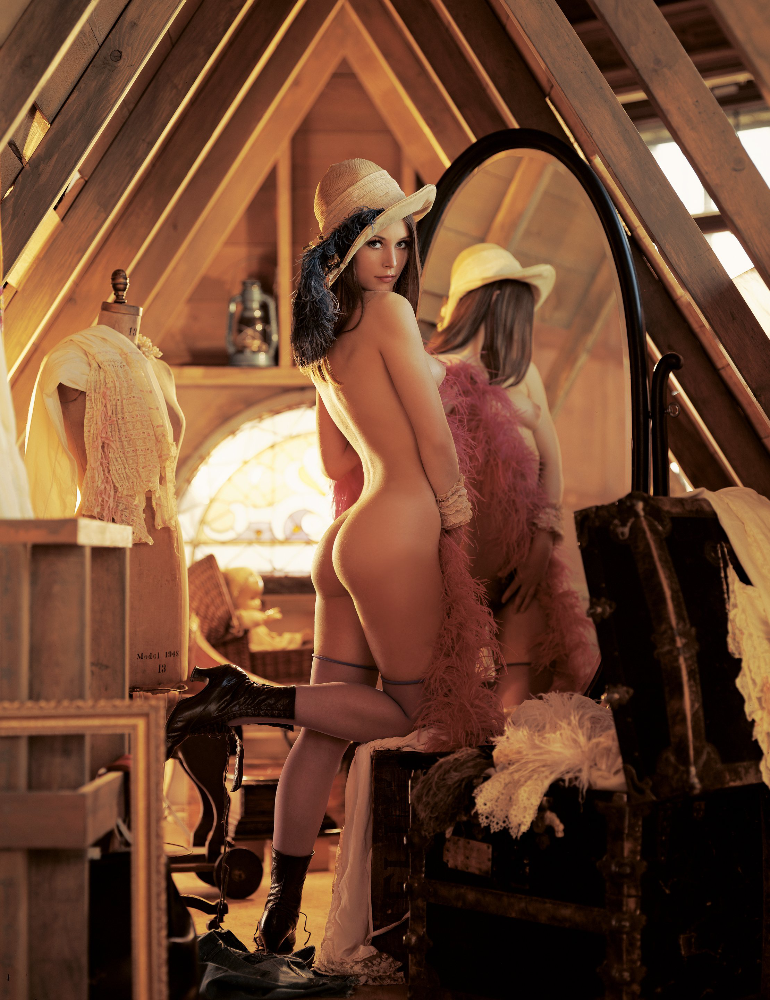

In [3]:
img

In [4]:
w, h = img.size

img = np.array(img)
img = img.reshape((h,w,3))

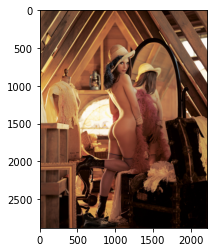

In [5]:
plt.imshow(img)

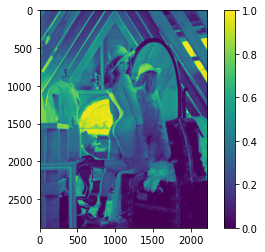

In [6]:
img = color.rgb2gray(img)
plt.imshow(img)
plt.colorbar()

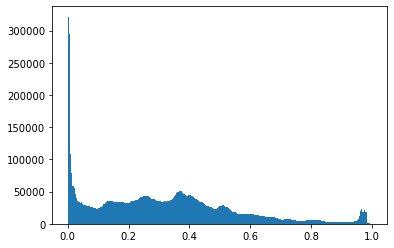

In [7]:
plot = plt.hist(img.ravel(), bins=255)
plt.show()

0.23734251392579464


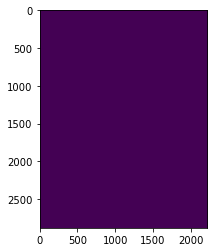

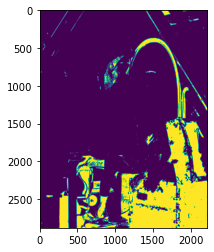

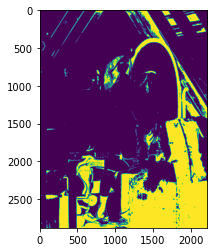

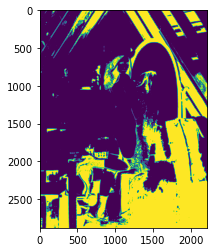

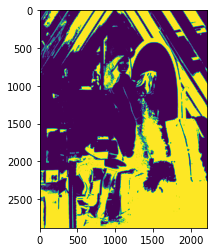

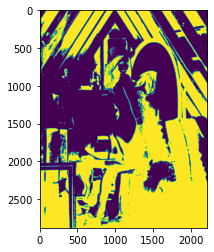

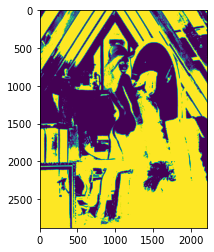

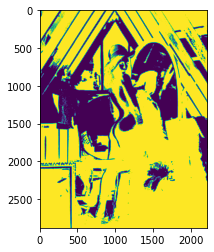

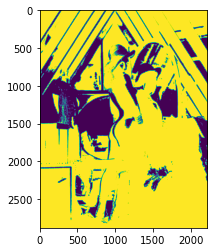

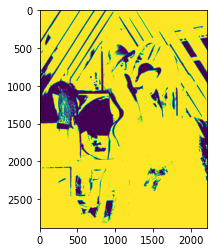

(10, 2880, 2219, 1)

In [8]:
# TODO: Filter on std deviations

# WARN: The top 10 is completly empty
standard_dev = np.std(img.ravel())
print(standard_dev)
tresholds = [i * standard_dev / 4 for i in range(10)]
tresholded_images = np.empty((10, h, w, 1))
for i, t in enumerate(tresholds):
    tresholded = np.array(list(map(lambda x: 1 if x < t else 0, img.ravel()))).reshape(h,w,1)
    plt.imshow(tresholded)
    plt.show()
    tresholded_images[i] = tresholded
tresholded_images.shape

In [9]:
filtered_images_horizontal = np.empty_like(tresholded_images)

for i, img in enumerate(tresholded_images):
    filtered_images_horizontal[i] = ndimage.generic_filter(img,
                                        sum,
                                        mode="reflect",
                                        footprint=[
                                            [[0], [1], [0]],
                                            [[0], [1], [0]],
                                            [[0], [1], [0]],
                                        ])


filtered_images_horizontal.shape

(10, 2880, 2219, 1)

In [10]:
filtered_images_vertical = np.empty_like(tresholded_images)

for i, img in enumerate(tresholded_images):
    filtered_images_vertical[i] = ndimage.generic_filter(img,
                                        sum,
                                        mode="reflect",
                                        footprint=[
                                            [[0], [0], [0]],
                                            [[1], [1], [1]],
                                            [[0], [0], [0]],
                                        ])


filtered_images_vertical.shape

(10, 2880, 2219, 1)

In [11]:
filtered_images_staged = np.empty_like(tresholded_images)
last = filtered_images_horizontal[0]
for i, img in enumerate(filtered_images_horizontal):
    filtered_images_staged[i] = np.array(list(map(lambda x: x if x > 0 else 0,(img - last).ravel()))).reshape(img.shape)
    last = img

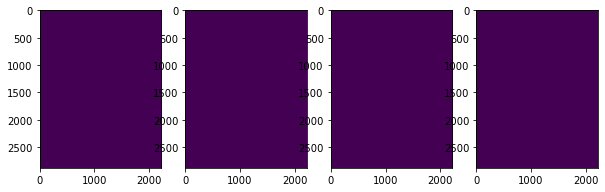

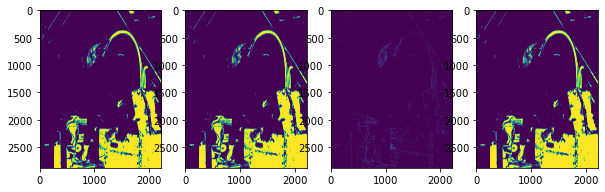

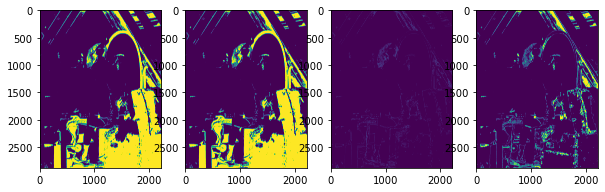

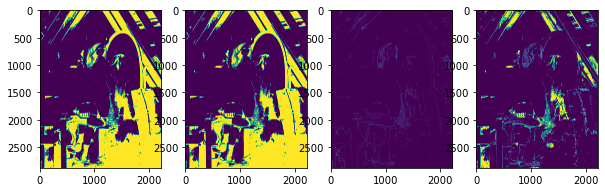

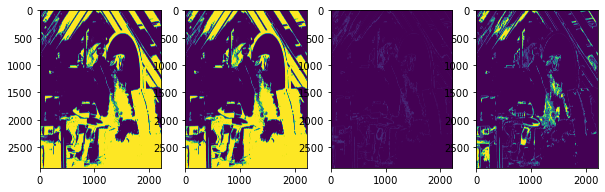

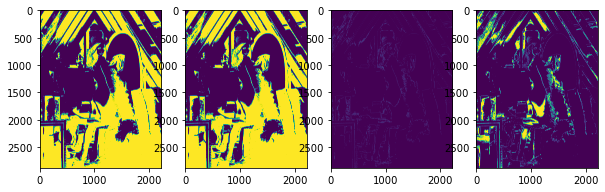

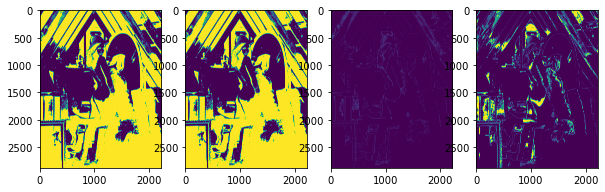

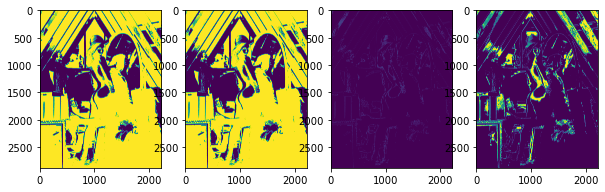

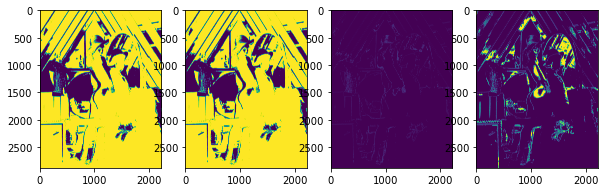

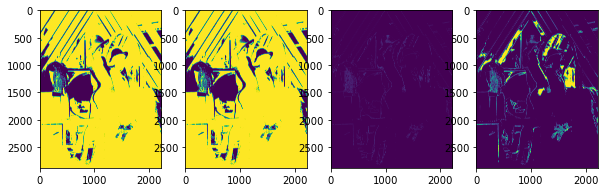

In [12]:
for img, img2, img3 in zip(filtered_images_horizontal, filtered_images_vertical, filtered_images_staged):
    plt.figure(figsize=(10,20))
    plt.subplot(1,4,1)
    plt.imshow(img)
    plt.subplot(1,4,2)
    plt.imshow(img2)
    plt.subplot(1,4,3)
    plt.imshow(np.array(list(map(lambda x: x if x > 0 else 0,(img - img2).ravel()))).reshape(img.shape))
    plt.subplot(1,4,4)
    plt.imshow(img3)
    plt.show()


In [13]:
# for img in filtered_images_horizontal:
#     ascent = img.ravel().reshape((h,w))

#     shar_matrix = np.array([[ -3-3j, 0-10j,  +3 -3j],
#                             [-10+0j, 0+ 0j, +10 +0j],
#                             [ -3+3j, 0+10j,  +3 +3j]]) # Gx + j*Gy
    
#     kojro_matrix = np.array([[ 3, 3, 3],
#                             [ 3, 7, 3],
#                             [ 3, 3, 3]]) # Gx + j*Gy
    
    
#     grad = signal.convolve2d(ascent, kojro_matrix, boundary='symm', mode='same')
#     plt.figure(figsize=(20,20))
#     plt.imshow(np.abs(grad))
#     plt.plot()

(1440, 1110)


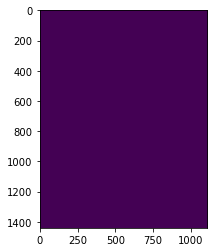

(1440, 1110)


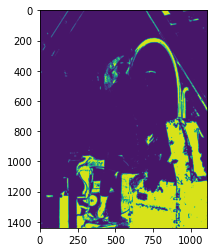

(1440, 1110)


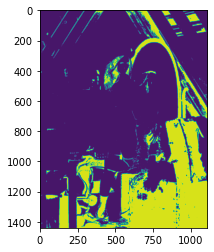

(1440, 1110)


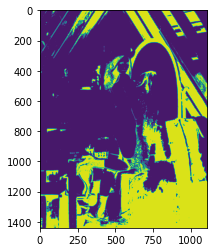

(1440, 1110)


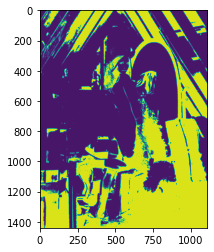

(1440, 1110)


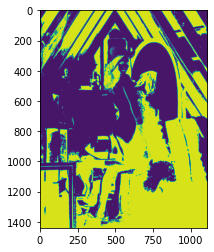

(1440, 1110)


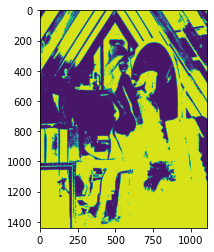

(1440, 1110)


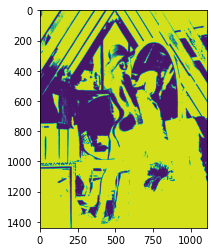

(1440, 1110)


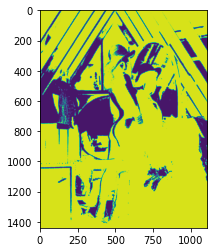

(1440, 1110)


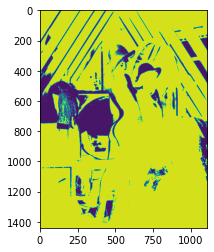

In [14]:

ready_images = []
for img in filtered_images_horizontal:
#     plt.figure(figsize=(20,20))
    zoomed = zoom(img.reshape(h,w),0.5)
    ready_images.append(zoomed)
    print(zoomed.shape)    
    plt.imshow(zoomed)
    plt.show()

In [15]:
%load_ext autoreload
%autoreload 2

from gcode_file_creator import GCodeFile
from command import DrawLine, Vec2, DisEngageTool

In [16]:
working_image = ready_images[3]
import matplotlib.patches as patches

min_x_move = 1 # in mm
min_y_move = 1 # in mm

bed_size_x = 20 * 10 # in mm
bed_size_y = 20 * 10 # in mm

h, w = zoomed.shape
assert h * min_y_move < bed_size_y , "Cannot draw with thsi many pixels in y"
assert w * min_x_move < bed_size_x , "Cannot draw with thsi many pixels in x"


gfile = GCodeFile("./out.gcode")
gfile.StartUp()
plt.clf()
plt.xlim(-700, 700)
plt.ylim(-700, 700)

for y, row in enumerate(working_image):
    start = None
    for x, pixel in enumerate(row):
        if pixel > 0:
            if x > 0 and row[x-1] > 0 and x != len(row) - 1:
                continue
            if start is None:
                start = Vec2(x=x, y=y)
            else:
                gfile.PushCommand(DrawLine(start, Vec2(x=x, y=y)))
                ax = plt.gca()
                ax.add_patch(patches.Rectangle((start.x,start.y),x-start.x, y-start.y+0.1))
                start = None
        
        if x == len(row) - 1:
            gfile.PushCommand(DisEngageTool())
            start = None
            
print(len(working_image))
gfile.ShutDown()
gfile.SaveFile()
plt.show()

AssertionError: Cannot draw with thsi many pixels in y